In [1]:
## load packages
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
from sklearn.impute import SimpleImputer  # For mean imputation
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer  # For model-based imputation
from scipy.interpolate import interp1d  # For interpolation-based imputation
from sklearn.neighbors import KNeighborsRegressor  # For KNN imputation
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor

from scipy.special import softmax
from statsmodels.tsa.statespace.sarimax import SARIMAX
import plotly.graph_objs as go
import matplotlib.pyplot as plt

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
def softmax_voting(*args):
    y = np.array([a for a in args])
    avg = []
    for i in range(y.shape[2]):
        avg.append((softmax(y[:,:,i])*y[:,:,i]).sum())
    return np.array(avg)

## Cleaning

In [4]:
df = pd.read_csv('dengue_features_train.csv')

In [5]:
df['week_start_date'] = pd.to_datetime(df['week_start_date'] , format = '%Y-%m-%d')

In [6]:
y = pd.read_csv('dengue_labels_train.csv')

In [7]:
y.set_index(['city','year','weekofyear'],inplace = True)

In [8]:
df.set_index(['city','year','weekofyear'],inplace = True)

In [9]:
df = pd.concat([df,y],axis=1)

In [10]:
df.reset_index(inplace = True)

In [11]:
df.set_index(["week_start_date"],inplace = True)

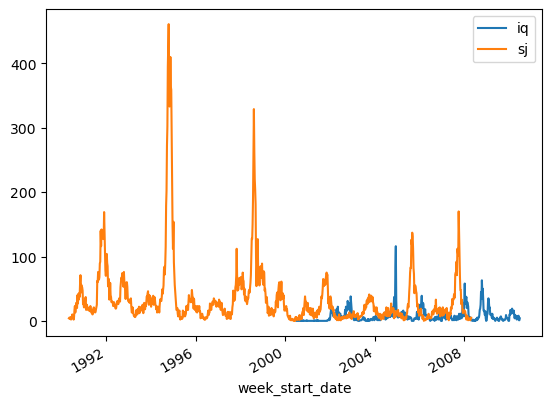

<Figure size 10000x5000 with 0 Axes>

In [12]:
df.groupby('city')['total_cases'].plot()
plt.legend()
plt.figure(figsize=(100, 50))
plt.show()

In [13]:
sj = df[df.city == 'sj']
iq = df[df.city == 'iq']

<Axes: xlabel='week_start_date'>

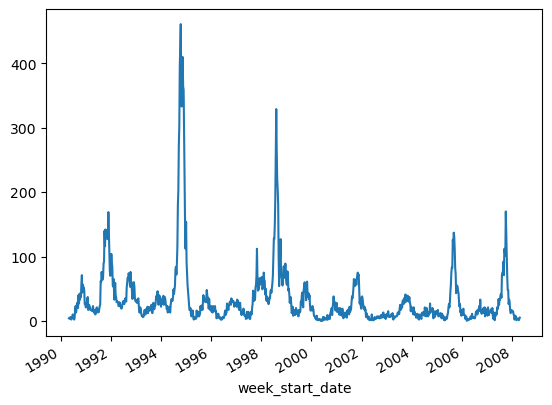

In [14]:
df[df['city'] == 'sj']['total_cases'].plot()

In [15]:
def combine_feature_with_label(feature_path,label_path):
    df = pd.read_csv(feature_path)
    df['week_start_date'] = pd.to_datetime(df['week_start_date'] , format = '%Y-%m-%d')
    y = pd.read_csv(label_path)
    y.set_index(['city','year','weekofyear'],inplace = True)
    df.set_index(['city','year','weekofyear'],inplace = True)
    df = pd.concat([df,y],axis=1)
    df.reset_index(inplace = True)
    df.set_index(["week_start_date"],inplace = True)
    
    return df

In [16]:
df = df.reset_index()

In [17]:
df = df.set_index(['city','year','weekofyear','week_start_date'])

In [18]:
X_sj = df.loc['sj'].drop(['total_cases'], axis =1)
y_sj = df.loc['sj']['total_cases']

In [19]:
X_iq = df.loc['iq'].drop(['total_cases'], axis =1)
y_iq = df.loc['iq']['total_cases']

In [20]:
X_sj.describe().T

,count,mean,std,min,25%,50%,75%,max
ndvi_ne,745.0,0.057925,0.107153,-0.406250,0.004500,0.057700,0.111100,0.493400
ndvi_nw,887.0,0.067469,0.092479,-0.456100,0.016425,0.068075,0.115200,0.437100
ndvi_se,917.0,0.177655,0.057166,-0.015533,0.139283,0.177186,0.212557,0.393129
ndvi_sw,917.0,0.165956,0.056073,-0.063457,0.129157,0.165971,0.202771,0.381420
precipitation_amt_mm,927.0,35.470809,44.606137,0.000000,0.000000,20.800000,52.180000,390.600000
reanalysis_air_temp_k,930.0,299.163653,1.236429,295.938571,298.195000,299.254286,300.132857,302.200000
reanalysis_avg_temp_k,930.0,299.276920,1.218637,296.114286,298.300000,299.378571,300.228571,302.164286
reanalysis_dew_point_temp_k,930.0,295.109519,1.569943,289.642857,293.847857,295.464286,296.418929,297.795714
reanalysis_max_air_temp_k,930.0,301.398817,1.258927,297.800000,300.400000,301.500000,302.400000,304.300000
reanalysis_min_air_temp_k,930.0,297.301828,1.294705,292.600000,296.300000,297.500000,298.400000,299.900000


<Axes: xlabel='week_start_date'>

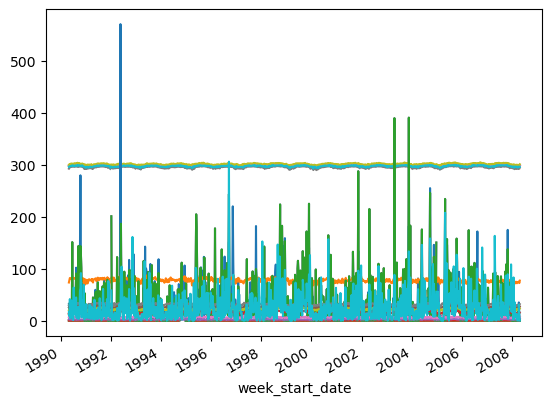

In [21]:
X_sj.reset_index().set_index('week_start_date').drop(['year','weekofyear'],axis =1).plot(legend = False)

<Axes: xlabel='week_start_date'>

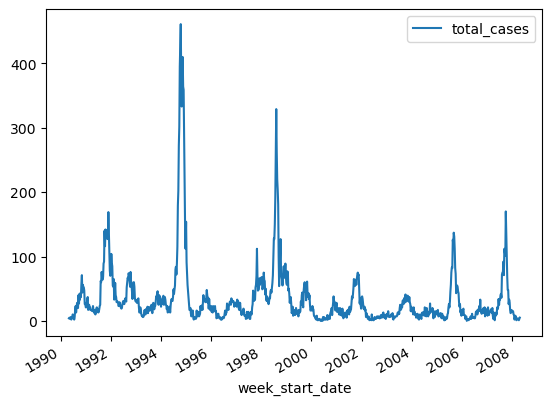

In [22]:
y_sj.reset_index().set_index('week_start_date').drop(['year','weekofyear'],axis =1).plot()

In [23]:
X_iq.describe().T

,count,mean,std,min,25%,50%,75%,max
ndvi_ne,517.0,0.263869,0.081370,0.061729,0.200000,0.263643,0.319971,0.508357
ndvi_nw,517.0,0.238783,0.076751,0.035860,0.179540,0.232971,0.293929,0.454429
ndvi_se,517.0,0.250126,0.077354,0.029880,0.194743,0.249800,0.302300,0.538314
ndvi_sw,517.0,0.266779,0.086345,0.064183,0.204129,0.262143,0.325150,0.546017
precipitation_amt_mm,516.0,64.245736,35.218995,0.000000,39.105000,60.470000,85.757500,210.830000
reanalysis_air_temp_k,516.0,297.869538,1.170997,294.635714,297.092500,297.822857,298.649286,301.637143
reanalysis_avg_temp_k,516.0,299.133043,1.332073,294.892857,298.221429,299.121429,300.123214,302.928571
reanalysis_dew_point_temp_k,516.0,295.492982,1.417229,290.088571,294.593929,295.852143,296.548571,298.450000
reanalysis_max_air_temp_k,516.0,307.082752,2.382980,300.000000,305.200000,307.050000,308.700000,314.000000
reanalysis_min_air_temp_k,516.0,292.866667,1.663069,286.900000,291.975000,293.050000,294.200000,296.000000


<Axes: xlabel='week_start_date'>

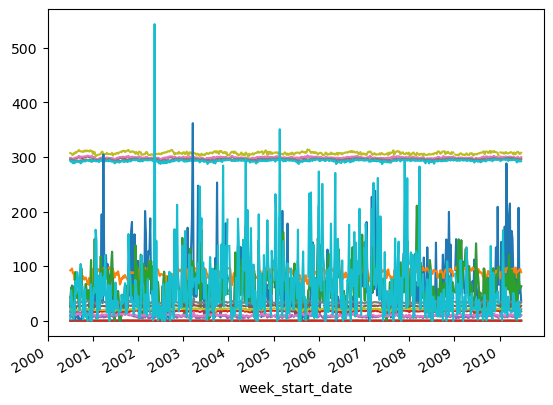

In [24]:
X_iq.reset_index().set_index('week_start_date').drop(['year','weekofyear'],axis =1).plot(legend = False)

<Axes: xlabel='week_start_date'>

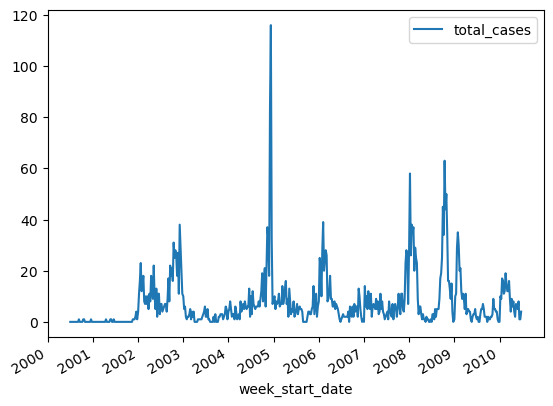

In [25]:
y_iq.reset_index().set_index('week_start_date').drop(['year','weekofyear'],axis =1).plot()

## Define Imputation Method

In [26]:
def fill_missing_values_with_mean(df):
    """
    Fill missing values in all columns of a DataFrame with the mean of each respective column.

    Parameters:
    - df (DataFrame): The input DataFrame.

    Returns:
    - df (DataFrame): The DataFrame with missing values in all columns filled with their respective means.
    """
    for column in df.columns:
        if df[column].isnull().any():
            mean_value = df[column].mean()
            df[column].fillna(mean_value, inplace=True)
    return df


def fill_missing_values_with_mode(df):
    """
    Fill missing values in all columns of a DataFrame with the mode (most frequent value) of each respective column.

    Parameters:
    - df (DataFrame): The input DataFrame.

    Returns:
    - df (DataFrame): The DataFrame with missing values in all columns filled with their respective modes.
    """
    for column in df.columns:
        if df[column].isnull().any():
            mode_value = df[column].mode()[0]  # Use mode() to get the most frequent value
            df[column].fillna(mode_value, inplace=True)
    return df

# Example usage:
# Assuming you have a DataFrame 'df' and want to fill missing values in all columns with mode:
# df = fill_missing_values_with_mode(df)


def fill_missing_values_with_ffill(df):
    """
    Fill missing values in all columns of a DataFrame using forward fill (ffill) method.

    Parameters:
    - df (DataFrame): The input DataFrame.

    Returns:
    - df (DataFrame): The DataFrame with missing values in all columns filled using forward fill.
    """
    df.fillna(method='ffill', inplace=True)
    return df

# Example usage:
# Assuming you have a DataFrame 'df' and want to fill missing values in all columns with forward fill:
# df = fill_missing_values_with_ffill(df)


def fill_missing_values_with_bfill(df):
    """
    Fill missing values in all columns of a DataFrame using backward fill (bfill) method.

    Parameters:
    - df (DataFrame): The input DataFrame.

    Returns:
    - df (DataFrame): The DataFrame with missing values in all columns filled using backward fill.
    """
    df.fillna(method='bfill', inplace=True)
    return df

# Example usage:
# Assuming you have a DataFrame 'df' and want to fill missing values in all columns with backward fill:
# df = fill_missing_values_with_bfill(df)


def fill_missing_values_with_linear_interpolation(df):
    """
    Fill missing values in all columns of a DataFrame using linear interpolation.

    Parameters:
    - df (DataFrame): The input DataFrame.

    Returns:
    - df (DataFrame): The DataFrame with missing values in all columns filled using linear interpolation.
    """
    df.interpolate(method='linear', inplace=True)
    return df

# Example usage:
# Assuming you have a DataFrame 'df' and want to fill missing values in all columns with linear interpolation:
# df = fill_missing_values_with_linear_interpolation(df)


## Define Training and Testing Functions

In [27]:
# Define a function to perform missing data imputation
def impute_missing_data(X, method):
    # Make a copy of the DataFrame to avoid modifying the original
    X_imputed = X.copy()

    if method == 'mean':
        X_imputed = fill_missing_values_with_mean(X_imputed)
    elif method == 'mode':
        X_imputed = fill_missing_values_with_mode(X_imputed)
    elif method == 'ffill':
        X_imputed = fill_missing_values_with_ffill(X_imputed)
    elif method == 'bfill':
        X_imputed = fill_missing_values_with_bfill(X_imputed)
    elif method == 'interpolation':
        X_imputed = fill_missing_values_with_linear_interpolation(X_imputed)
    else:
        raise ValueError("Invalid imputation method")
    
    return X_imputed 

In [28]:
# Define a function to evaluate model performance
def evaluate_model_SJ(X_train, y_train, X_test, y_test, model_type):
    X_train = X_train.reset_index(drop=True).dropna()
    y_train = y_train.reset_index(drop=True).dropna()
    
    if model_type == 'ARIMA': 
        model = ARIMA(y_train, order=(9, 0, 13))       
        model_fit = model.fit()      
        y_pred = model_fit.forecast(steps=len(X_test))
       
    elif model_type == 'RandomForest':
        model = RandomForestRegressor(n_estimators=100, random_state=42)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
    elif model_type == 'LSTM':
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))
        
        # Define LSTM model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')
        
        # Fit the model
        model.fit(X_train_reshaped, y_train, epochs=50, batch_size=72, verbose=0)
        
        # Make predictions
        y_pred = model.predict(X_test_reshaped)
        y_pred = y_pred.flatten()
        
    elif model_type == 'SARIMAX':
        model = SARIMAX(y_train, exog=X_train, order=(9, 0, 13), seasonal_order=(0, 1, 0, 6))
        model_fit = model.fit(disp=False)
        y_pred = model_fit.get_forecast(steps=len(X_test), exog=X_test).predicted_mean
        
    elif model_type == 'KNN':
        model = KNeighborsRegressor(n_neighbors=5)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
   
    elif model_type == 'Voting_simple':
        model1 = ARIMA(y_train, order=(9, 0, 13))
        model_fit_1 = model1.fit()
        y_pred_1 = model_fit_1.forecast(steps=len(X_test))
            
        model_2 = RandomForestRegressor(n_estimators=100, random_state=42)
        model_2.fit(X_train, y_train)
        y_pred_2 = model_2.predict(X_test)
        
        model_3 = SARIMAX(y_train, exog=X_train, order=(9, 0, 13), seasonal_order=(0, 1, 0, 12))
        model_fit_3 = model_3.fit(disp=False)
        y_pred_3 = model_fit_3.get_forecast(steps=len(X_test), exog=X_test).predicted_mean
        
        model_4 = KNeighborsRegressor(n_neighbors=5)
        model_4.fit(X_train, y_train)
        y_pred_4 = model_4.predict(X_test)
        
        weight = np.array([0.1,0.2,0.5,0.2])
        y_pred = weight@ np.array([y_pred_1,y_pred_2,y_pred_3,y_pred_4])
       
    elif model_type == 'Voting_softmax':
        model1 = ARIMA(y_train, order=(9, 0, 13))
        model_fit_1 = model1.fit()
        y_pred_1 = model_fit_1.forecast(steps=len(X_test))   
            
        model_2 = RandomForestRegressor(n_estimators=100, random_state=42)
        model_2.fit(X_train, y_train)
        y_pred_2 = model_2.predict(X_test)
        
        model_3 = SARIMAX(y_train, exog=X_train, order=(9, 0, 13), seasonal_order=(0, 1, 0, 12))
        model_fit_3 = model_3.fit(disp=False)
        y_pred_3 = model_fit_3.get_forecast(steps=len(X_test), exog=X_test).predicted_mean
        
        model_4 = KNeighborsRegressor(n_neighbors=5)
        model_4.fit(X_train, y_train)
        y_pred_4 = model_4.predict(X_test)
        
        y_pred = softmax_voting(np.array([y_pred_1,y_pred_2,y_pred_3,y_pred_4 ]))

    else:
        raise ValueError("Invalid model type") 
         
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    return mse, mae, r2, y_pred

In [29]:
def drop_down():
    df = pd.DataFrame(predicted_time_series)

    # Extract dates and actual values
    dates = y_test.index.get_level_values(2)
    actual_values = y_test.values.flatten()

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=dates, 
        y=actual_values,
        mode='lines',
        name='Actual Values',  # Set legend name for actual values
        line=dict(color='blue', width=2)  # Set line color to blue
    ))
    
    model_colors = {
        'ARIMA': 'red',
        'RandomForest': 'green',
        'LSTM': 'purple',
        'SARIMAX': 'orange',
        'KNN' : 'magenta',
        'Voting_simple': 'brown',
        
        'Voting_softmax' : 'black'
    }
   
    for imputation_method in df['imputation_method'].unique():
        for model_type in df['model_type'].unique():
            predictions = df[(df['imputation_method'] == imputation_method) & (df['model_type'] == model_type)]['predictions'].iloc[0]

            fig.add_trace(go.Scatter(
                x=dates, 
                y=predictions,
                mode='lines',
                name=f'Predicted  Values - {model_type}',
                line=dict(color=model_colors[model_type], width=2),
                visible=False  # Start with these traces invisible
            ))

    # Create dropdown buttons for each imputation method
    dropdown_buttons = []
    for imputation_method in df['imputation_method'].unique():
        visible_traces = [imputation_method == method for method in df['imputation_method']]
        visible_traces = [True] + visible_traces  # Include actual values trace

        dropdown_buttons.append(
            {'label': f'{imputation_method}',
             'method': 'update',
             'args': [{'visible': visible_traces},
                      {'title': f'Imputation Method: {imputation_method} Predictions'}]}
        )

    # Update figure layout
    fig.update_layout(
        updatemenus=[
            {"buttons": dropdown_buttons,
             "direction": "down",
             "showactive": True,
             }
        ],
        title="Model Predictions with Different Imputations Compared to Actual Values",
        xaxis_title="Date",
        yaxis_title="Values",
        legend_title="Legend",
        hovermode="x",
        height=800
    )

    fig.show()


In [30]:
# List of imputation methods to compare
imputation_methods = ['mean', 'mode','ffill','bfill', 'interpolation']

# List of model types to compare
model_types = ['ARIMA', 'RandomForest', 'KNN', 'SARIMAX','Voting_simple', "Voting_softmax"]  # LSTM code to be added

In [31]:
from sklearn.preprocessing import LabelEncoder
from statsmodels.tsa.statespace.sarimax import SARIMAX

## San Juan

In [32]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.iloc[:train_size], X_sj.iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
      
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1693.163040,31.586554,-1.077855
2,mean,KNN,1400.312650,27.161538,-0.718468
3,mean,SARIMAX,783.683176,23.381157,0.038261
4,mean,Voting_simple,619.936371,16.384630,0.239212
5,mean,Voting_softmax,2306.817267,40.709384,-1.830934
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1415.853253,28.580771,-0.737540
8,mode,KNN,1395.546154,27.048718,-0.712619
9,mode,SARIMAX,819.982824,23.932007,-0.006286


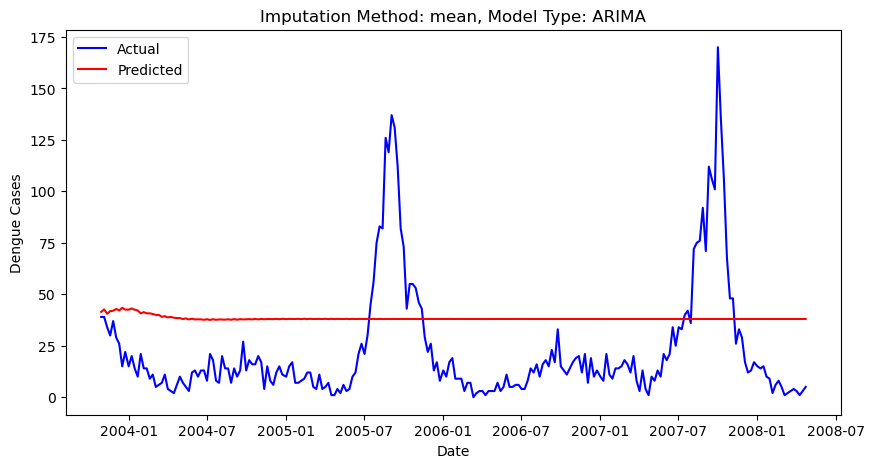

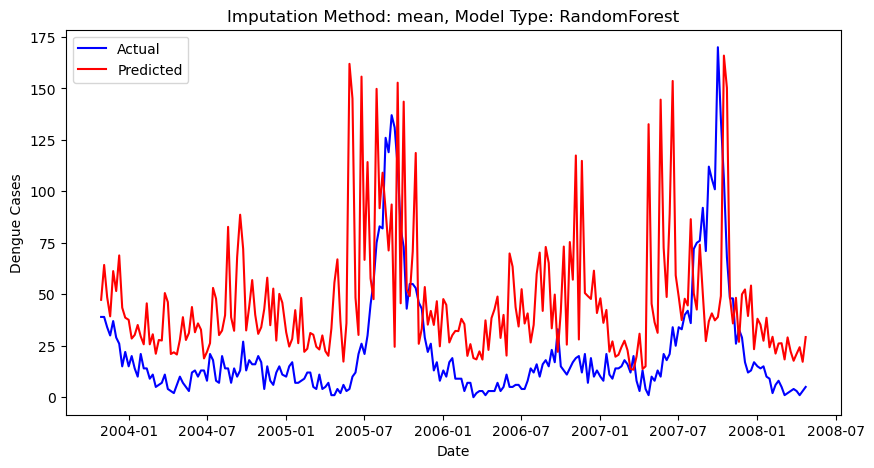

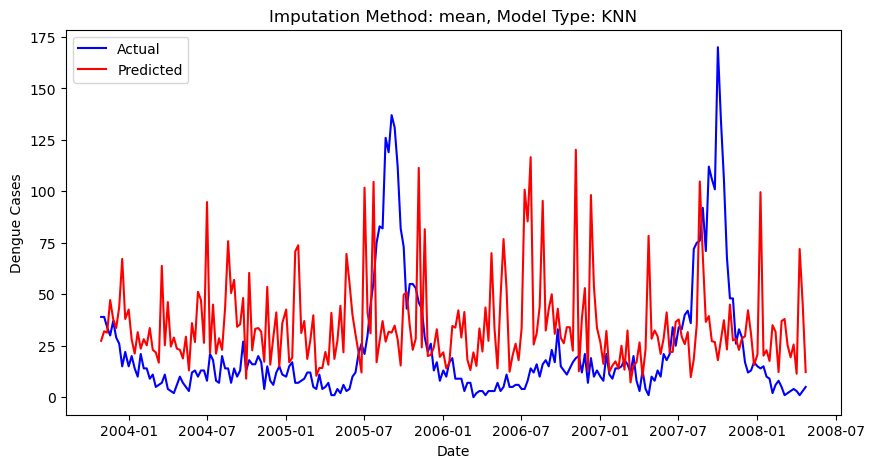

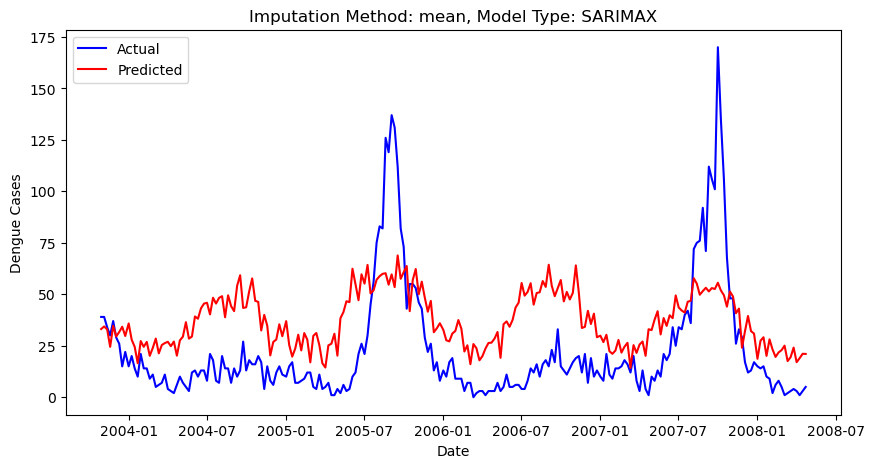

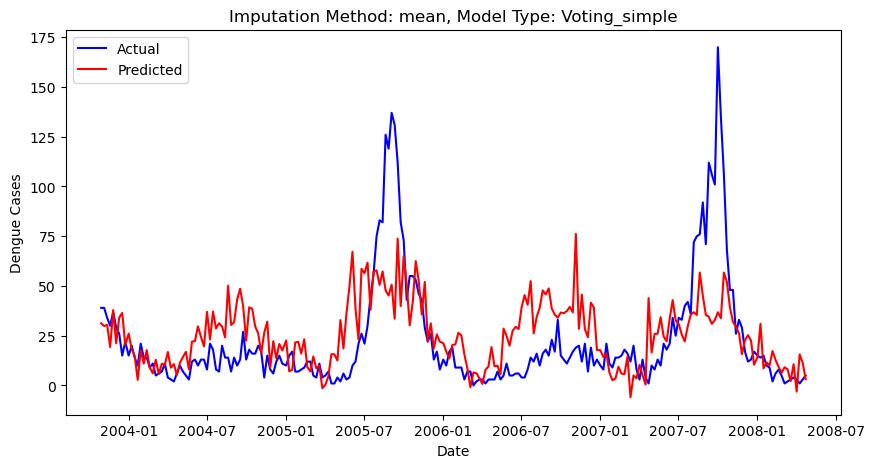

...

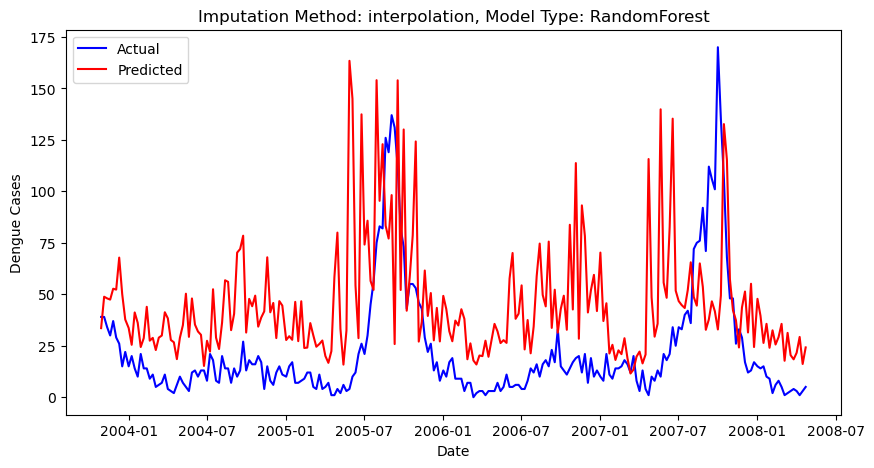

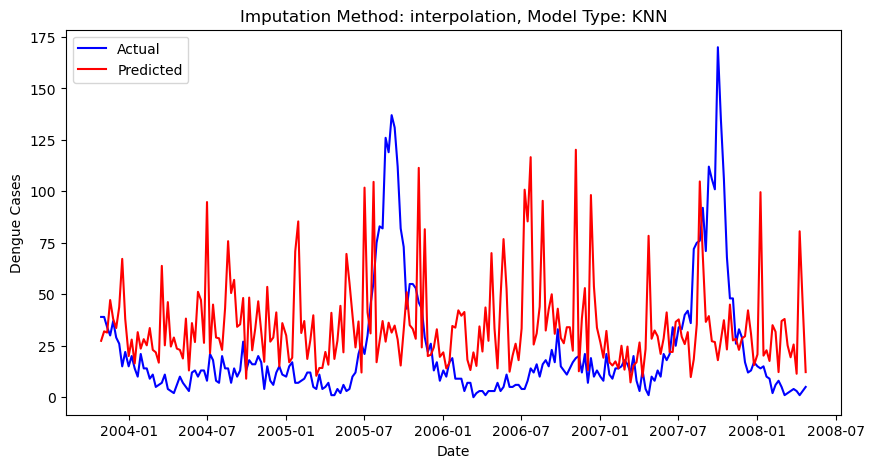

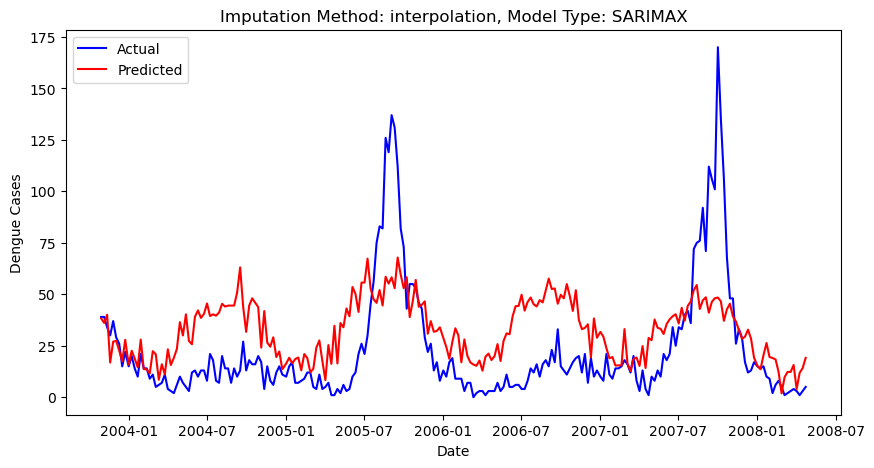

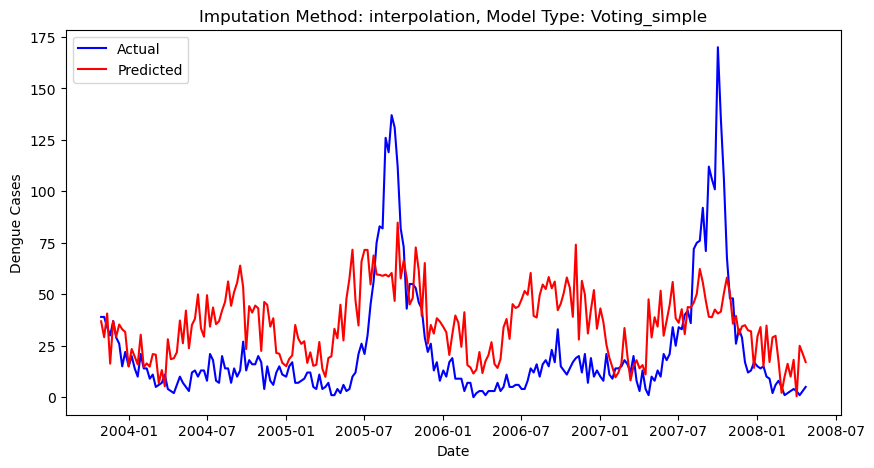

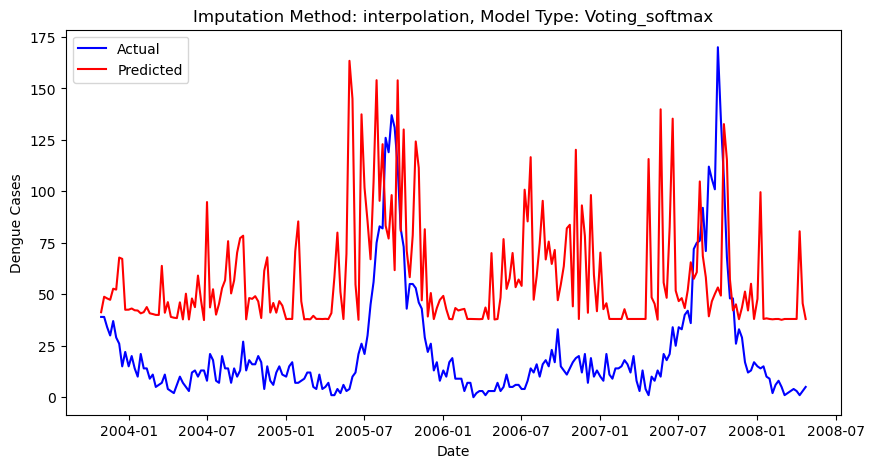

In [33]:
# Plot the predicted time series against the actual one for each combination of imputation method and model
for item in predicted_time_series:
    imputation_method = item['imputation_method']
    model_type = item['model_type']
    y_pred = item['predictions']
    
    # Plot the actual and predicted time series
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index.get_level_values(2), y_test, label='Actual', color='blue')
    plt.plot(y_test.index.get_level_values(2), y_pred, label='Predicted', color='red')
    plt.xlabel('Date')
    plt.ylabel('Dengue Cases')
    plt.title(f'Imputation Method: {imputation_method}, Model Type: {model_type}')
    plt.legend()
    
    plt.show()

In [34]:
drop_down()

In [35]:
# Define a function to evaluate model performance
def evaluate_model_IQ(X_train, y_train, X_test, y_test, model_type):
    X_train = X_train.reset_index(drop=True).dropna()
    y_train = y_train.reset_index(drop=True).dropna()
    if model_type == 'ARIMA':
        model = ARIMA(y_train, order=(5, 0, 8))
        model_fit = model.fit()
        y_pred = model_fit.forecast(steps=len(X_test))
      
    elif model_type == 'RandomForest':
        model = RandomForestRegressor(n_estimators=100, random_state=42)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
    elif model_type == 'LSTM':
        X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
        X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))
        
        # Define LSTM model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])))
        model.add(Dense(1))
        model.compile(optimizer='adam', loss='mse')
        
        # Fit the model
        model.fit(X_train_reshaped, y_train, epochs=50, batch_size=72, verbose=0)
        
        # Make predictions
        y_pred = model.predict(X_test_reshaped)
        y_pred = y_pred.flatten()
        
    elif model_type == 'KNN':
        model = KNeighborsRegressor(n_neighbors=5)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
    elif model_type == 'SARIMAX':
        model = SARIMAX(y_train, exog=X_train, order=(5, 0, 8), seasonal_order=(0, 1, 0, 6))
        model_fit = model.fit(disp=False)
        y_pred = model_fit.get_forecast(steps=len(X_test), exog=X_test).predicted_mean
        
    elif model_type == 'Voting_simple':
        model1 = ARIMA(y_train, order=(5, 0,8 ))
        model_fit_1 = model1.fit()
        y_pred_1 = model_fit_1.forecast(steps=len(X_test))       
            
        model_2 = RandomForestRegressor(n_estimators=100, random_state=42)
        model_2.fit(X_train, y_train)
        y_pred_2 = model_2.predict(X_test)

        model_3 = SARIMAX(y_train, exog=X_train, order=(5, 0, 8), seasonal_order=(0, 1, 0, 12))
        model_fit_3 = model_3.fit(disp=False)
        y_pred_3 = model_fit_3.get_forecast(steps=len(X_test), exog=X_test).predicted_mean
        
        model_4 = KNeighborsRegressor(n_neighbors=5)
        model_4.fit(X_train, y_train)
        y_pred_4 = model_4.predict(X_test)
              
        weight = np.array([0.3,0.3,0.1,0.3])
        y_pred = weight@ np.array([y_pred_1,y_pred_2,y_pred_3,y_pred_4])
        
    elif model_type == 'Voting_softmax':
        model1 = ARIMA(y_train, order=(9, 0, 13))
        model_fit_1 = model1.fit()
        y_pred_1 = model_fit_1.forecast(steps=len(X_test))
                     
        model_2 = RandomForestRegressor(n_estimators=100, random_state=42)
        model_2.fit(X_train, y_train)
        y_pred_2 = model_2.predict(X_test)
        
        model_3 = SARIMAX(y_train, exog=X_train, order=(5, 0, 8), seasonal_order=(0, 1, 0, 12))
        model_fit_3 = model_3.fit(disp=False)
        y_pred_3 = model_fit_3.get_forecast(steps=len(X_test), exog=X_test).predicted_mean
               
        model_4 = KNeighborsRegressor(n_neighbors=5)
        model_4.fit(X_train, y_train)
        y_pred_4 = model_4.predict(X_test)
        
        y_pred = softmax_voting(np.array([y_pred_1,y_pred_2,y_pred_3,y_pred_4 ]))
         
    else:
        raise ValueError("Invalid model type") 
        
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    return mse, mae, r2, y_pred

## Iquitos

In [36]:
train_size = int(len(X_iq) * 0.69) 
# Split the data into training and testing sets
X_train, X_test = X_iq.iloc[:train_size], X_iq.iloc[train_size:]
y_train, y_test = y_iq.iloc[:train_size], y_iq.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_IQ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
             
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

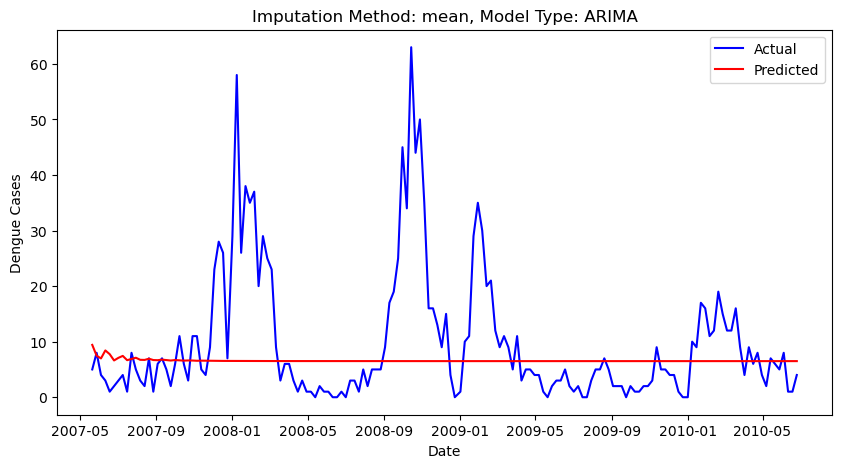

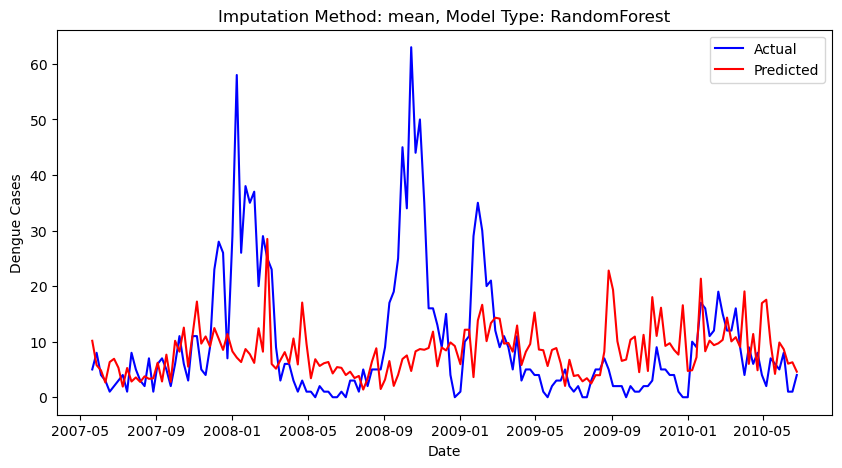

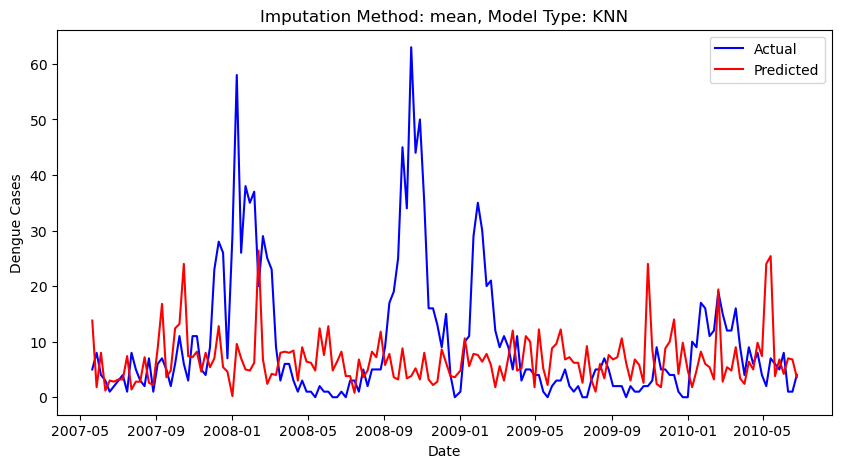

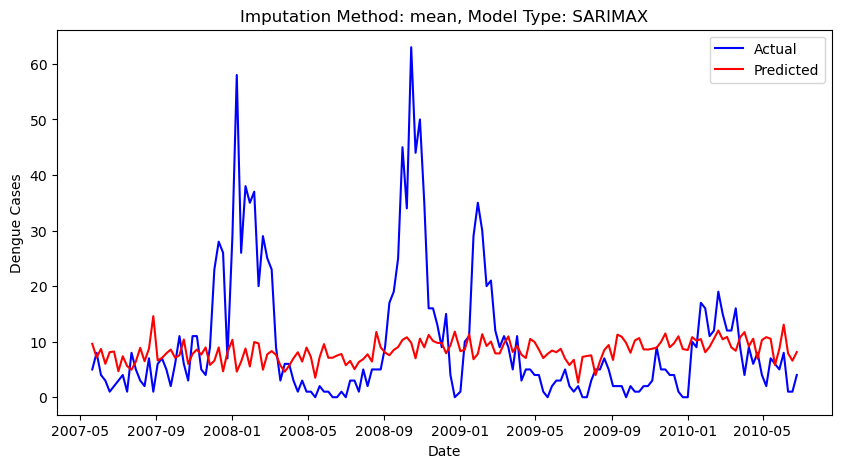

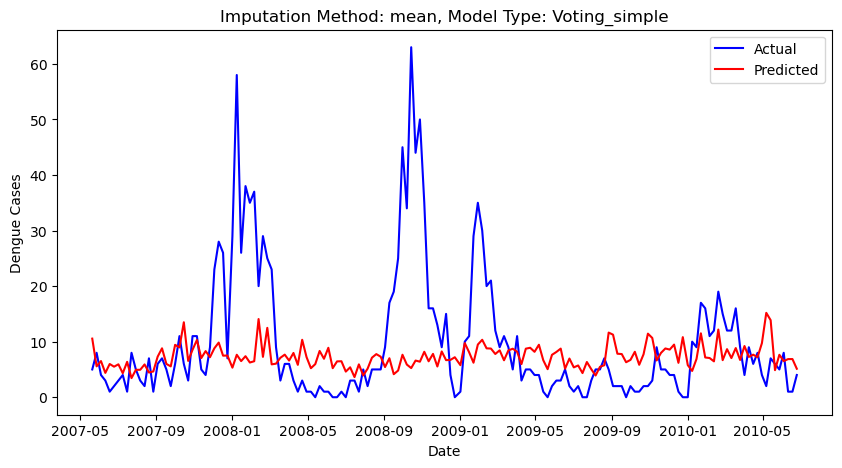

...

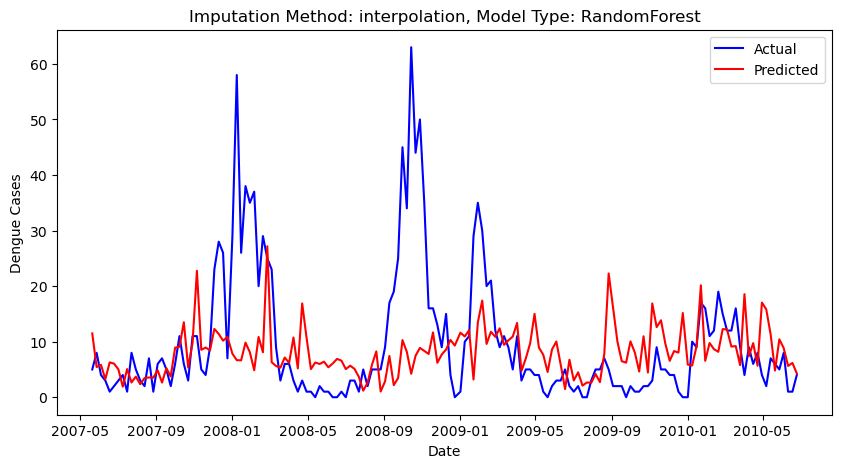

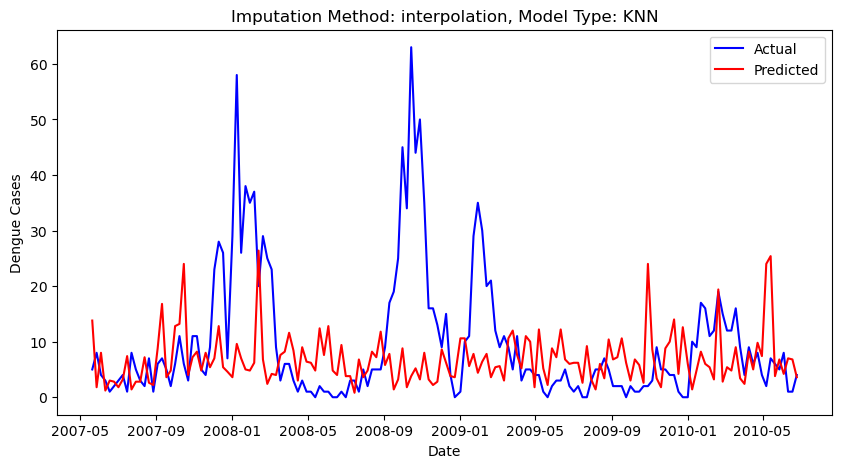

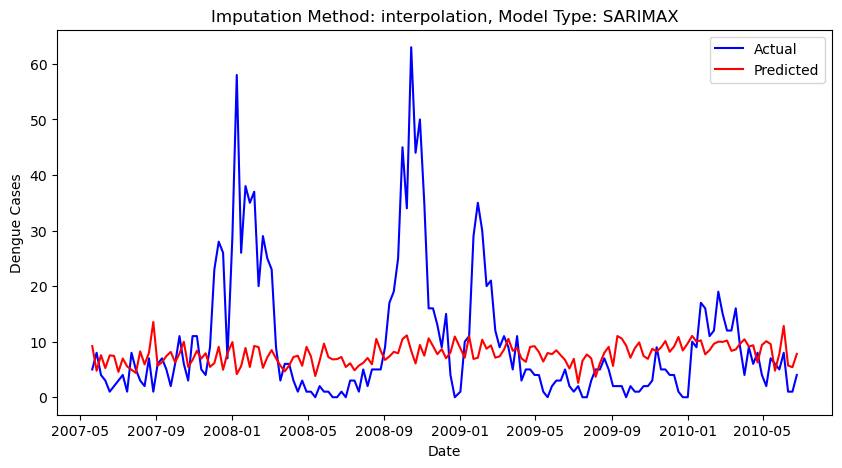

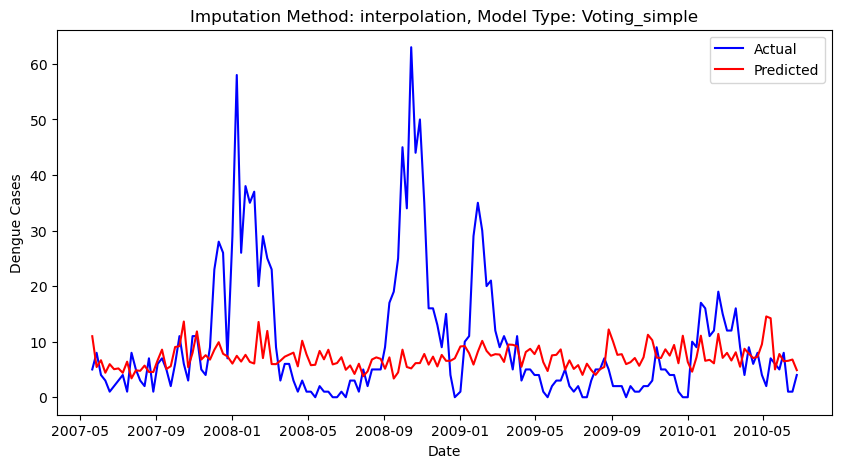

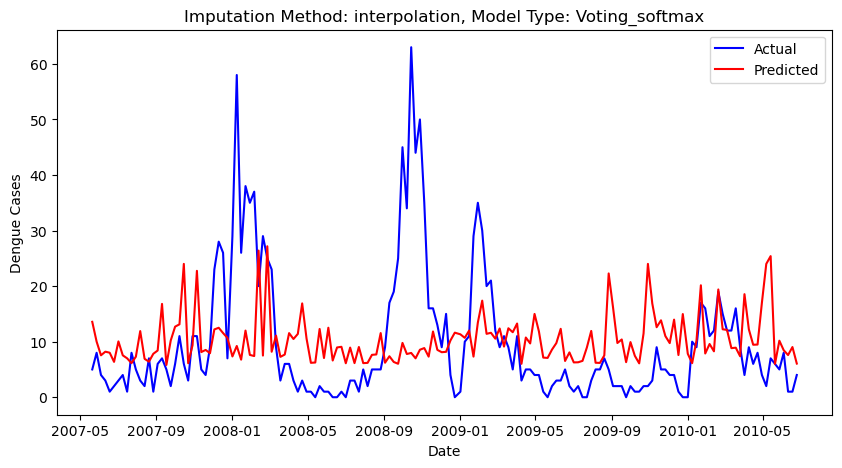

In [37]:
# Plot the predicted time series against the actual one for each combination of imputation method and model
for item in predicted_time_series:
    imputation_method = item['imputation_method']
    model_type = item['model_type']
    y_pred = item['predictions']
    
    # Plot the actual and predicted time series
    plt.figure(figsize=(10, 5))
    plt.plot(y_test.index.get_level_values(2), y_test, label='Actual', color='blue')
    plt.plot(y_test.index.get_level_values(2), y_pred, label='Predicted', color='red')
    plt.xlabel('Date')
    plt.ylabel('Dengue Cases')
    plt.title(f'Imputation Method: {imputation_method}, Model Type: {model_type}')
    plt.legend()
    
    #plt.savefig(f'P:/Data Mining/dengue_prediction_{imputation_method}_{model_type}.png')
    plt.show()

In [38]:
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,147.711750,7.529955,-0.078261
1,mean,RandomForest,145.992200,7.692222,-0.065709
2,mean,KNN,170.341728,8.582716,-0.243454
3,mean,SARIMAX,138.919856,7.689567,-0.014082
4,mean,Voting_simple,143.804561,7.559408,-0.049739
5,mean,Voting_softmax,155.904594,8.861331,-0.138067
6,mode,ARIMA,147.711750,7.529955,-0.078261
7,mode,RandomForest,152.775119,7.684691,-0.115222
8,mode,KNN,170.536296,8.493827,-0.244875
9,mode,SARIMAX,145.878749,7.584238,-0.064880


In [39]:
drop_down()

# San Juan Time leads

In [40]:
# List of imputation methods to compare
imputation_methods = ['mean', 'mode']

# List of model types to compare
model_types = ['ARIMA', 'RandomForest', 'KNN','SARIMAX', 'Voting_simple', "Voting_softmax"]  # LSTM code to be added

In [41]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(10).iloc[:train_size], X_sj.shift(10).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
 
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1324.852476,28.170170,-0.625863
2,mean,KNN,1435.332991,27.892308,-0.761445
3,mean,SARIMAX,995.252207,27.378289,-0.221377
4,mean,Voting_simple,654.956620,19.224029,0.196235
5,mean,Voting_softmax,2228.751458,41.746799,-1.735131
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1320.548588,27.316150,-0.620582
8,mode,KNN,1412.626667,27.731624,-0.733580
9,mode,SARIMAX,957.454728,26.812472,-0.174992


In [42]:
drop_down()

In [43]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(9).iloc[:train_size], X_sj.shift(9).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
      
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1408.921510,29.233584,-0.729033
2,mean,KNN,1447.525641,27.547863,-0.776408
3,mean,SARIMAX,978.521599,27.206701,-0.200845
4,mean,Voting_simple,891.254022,25.529667,-0.093750
5,mean,Voting_softmax,2356.362765,43.620528,-1.891736
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1333.833209,28.076127,-0.636884
8,mode,KNN,1448.546667,27.670085,-0.777661
9,mode,SARIMAX,978.127450,26.848917,-0.200361


In [44]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(10).iloc[:train_size], X_sj.shift(10).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
     
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1324.852476,28.170170,-0.625863
2,mean,KNN,1435.332991,27.892308,-0.761445
3,mean,SARIMAX,995.252207,27.378289,-0.221377
4,mean,Voting_simple,654.956620,19.224029,0.196235
5,mean,Voting_softmax,2228.751458,41.746799,-1.735131
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1320.548588,27.316150,-0.620582
8,mode,KNN,1412.626667,27.731624,-0.733580
9,mode,SARIMAX,957.454728,26.812472,-0.174992


In [45]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(8).iloc[:train_size], X_sj.shift(8).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
     
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1414.650539,28.591137,-0.736064
2,mean,KNN,1458.376581,27.308547,-0.789725
3,mean,SARIMAX,925.880860,26.508545,-0.136244
4,mean,Voting_simple,645.711819,18.563430,0.207580
5,mean,Voting_softmax,2369.635672,42.641622,-1.908025
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1609.882816,29.639539,-0.975653
8,mode,KNN,1465.545641,27.487179,-0.798522
9,mode,SARIMAX,939.383790,27.079563,-0.152815


In [46]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(7).iloc[:train_size], X_sj.shift(7).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
      
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1552.902524,28.934304,-0.905727
2,mean,KNN,1436.514701,27.282906,-0.762896
3,mean,SARIMAX,1000.447781,27.523723,-0.227753
4,mean,Voting_simple,739.500073,21.541587,0.092483
5,mean,Voting_softmax,2442.942789,42.003555,-1.997987
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1644.827046,29.194213,-1.018537
8,mode,KNN,1439.570085,27.416239,-0.766645
9,mode,SARIMAX,926.481663,26.375235,-0.136981


In [47]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(6).iloc[:train_size], X_sj.shift(6).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
        
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1863.630615,31.235787,-1.287054
2,mean,KNN,1373.068205,26.718803,-0.685034
3,mean,SARIMAX,959.297858,27.335958,-0.177253
4,mean,Voting_simple,825.733602,23.199808,-0.013343
5,mean,Voting_softmax,2700.615350,43.939825,-2.314204
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1880.777731,31.145661,-1.308097
8,mode,KNN,1368.318974,26.615385,-0.679206
9,mode,SARIMAX,960.562150,27.265546,-0.178805


In [48]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(5).iloc[:train_size], X_sj.shift(5).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
     
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1870.432664,31.553402,-1.295401
2,mean,KNN,1287.796923,26.584615,-0.580389
3,mean,SARIMAX,984.559426,28.162689,-0.208255
4,mean,Voting_simple,754.134075,21.889621,0.074524
5,mean,Voting_softmax,2621.383307,43.368671,-2.216970
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1945.884496,31.937073,-1.387996
8,mode,KNN,1282.848205,26.488889,-0.574316
9,mode,SARIMAX,977.564679,27.875363,-0.199671


In [49]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(4).iloc[:train_size], X_sj.shift(4).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
             
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1621.887448,29.547881,-0.990386
2,mean,KNN,1367.187863,26.790598,-0.677817
3,mean,SARIMAX,999.889222,28.390851,-0.227067
4,mean,Voting_simple,758.866894,22.150041,0.068716
5,mean,Voting_softmax,2398.408484,41.556346,-1.943335
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1604.153727,30.217325,-0.968623
8,mode,KNN,1359.295214,26.652137,-0.668132
9,mode,SARIMAX,964.051618,27.704867,-0.183087


In [50]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(3).iloc[:train_size], X_sj.shift(3).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
       
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1490.668555,29.183178,-0.829353
2,mean,KNN,1378.902906,26.958974,-0.692194
3,mean,SARIMAX,915.237345,26.707218,-0.123182
4,mean,Voting_simple,615.988297,17.397647,0.244057
5,mean,Voting_softmax,2267.652796,40.388326,-1.782871
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1521.902515,29.590749,-0.867684
8,mode,KNN,1373.327863,26.888889,-0.685352
9,mode,SARIMAX,937.486205,27.014076,-0.150486


In [51]:
drop_down()

In [52]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(2).iloc[:train_size], X_sj.shift(2).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
              
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1300.500920,28.773837,-0.595979
2,mean,KNN,1426.200000,27.863248,-0.750237
3,mean,SARIMAX,807.474747,24.018946,0.009064
4,mean,Voting_simple,640.637820,17.704649,0.213807
5,mean,Voting_softmax,2050.056464,39.650769,-1.515836
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1305.433622,28.729834,-0.602032
8,mode,KNN,1422.269573,27.828205,-0.745414
9,mode,SARIMAX,823.013061,24.466784,-0.010004


In [53]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj.shift(1).iloc[:train_size], X_sj.shift(1).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
      
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1488.192242,30.284784,-0.826314
2,mean,KNN,1397.463419,27.281197,-0.714972
3,mean,SARIMAX,668.268791,20.465035,0.179898
4,mean,Voting_simple,650.743802,18.235328,0.201405
5,mean,Voting_softmax,2125.347065,39.641805,-1.608233
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1445.581404,29.216943,-0.774022
8,mode,KNN,1387.483077,27.082051,-0.702724
9,mode,SARIMAX,765.574310,22.977826,0.060485


# San Juan Reduced Sets

In [54]:
# List of imputation methods to compare
imputation_methods = ['mean', 'mode']

# List of model types to compare
model_types = ['ARIMA', 'RandomForest', 'KNN','SARIMAX', 'Voting_simple', "Voting_softmax"]  # LSTM code to be added

In [55]:
train_size = int(len(X_sj) * 0.75) 
# Split the data into training and testing sets
X_train, X_test = X_sj[['reanalysis_tdtr_k','ndvi_nw','reanalysis_precip_amt_kg_per_m2',\
                        'precipitation_amt_mm','station_precip_mm','reanalysis_avg_temp_k','station_avg_temp_c']].shift(10).iloc[:train_size],\
                  X_sj[['reanalysis_tdtr_k','ndvi_nw','reanalysis_precip_amt_kg_per_m2',\
                        'precipitation_amt_mm','station_precip_mm','reanalysis_avg_temp_k','station_avg_temp_c']].shift(10).iloc[train_size:]
y_train, y_test = y_sj.iloc[:train_size], y_sj.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        X_train_imputed = impute_missing_data(X_train, imputation_method)
        X_test_imputed = impute_missing_data(X_test, imputation_method)
        
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_SJ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
      
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)

# Print and analyze the results
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,1061.439202,28.326754,-0.302602
1,mean,RandomForest,1064.818154,24.240413,-0.306748
2,mean,KNN,1301.801709,26.589744,-0.597575
3,mean,SARIMAX,901.758210,26.154705,-0.106641
4,mean,Voting_simple,710.334554,20.686023,0.128275
5,mean,Voting_softmax,1868.625132,37.611246,-1.293183
6,mode,ARIMA,1061.439202,28.326754,-0.302602
7,mode,RandomForest,1093.860983,24.404024,-0.342390
8,mode,KNN,1298.247521,26.504274,-0.593214
9,mode,SARIMAX,895.038923,25.913283,-0.098395


In [56]:
drop_down()

# Iquitos reduced sets

In [57]:
reduced_set=['ndvi_se','ndvi_ne','reanalysis_avg_temp_k','reanalysis_tdtr_k','station_precip_mm','reanalysis_min_air_temp_k','reanalysis_dew_point_temp_k','reanalysis_precip_amt_kg_per_m2','reanalysis_sat_precip_amt_mm','precipitation_amt_mm','reanalysis_relative_humidity_percent']

In [58]:
train_size = int(len(X_iq) * 0.69) 
# Split the data into training and testing sets
X_train, X_test = X_iq[reduced_set].iloc[:train_size], X_iq[reduced_set].iloc[train_size:]
y_train, y_test = y_iq.iloc[:train_size], y_iq.iloc[train_size:]

# Initialize dictionaries to store results
results = {'imputation_method': [], 'model_type': [], 'mse': [], 'mae':[], 'r2': []}

# Initialize a list to store predicted time series
predicted_time_series = []

# Iterate over imputation methods and model types
for imputation_method in imputation_methods:
    for model_type in model_types:
        # Perform imputation
        scaler = StandardScaler()
        
        X_train_imputed = impute_missing_data(X_train, imputation_method)
       
        X_test_imputed = impute_missing_data(X_test, imputation_method)
      
        # Evaluate the model
        mse, mae, r2, y_pred = evaluate_model_IQ(X_train_imputed, y_train, X_test_imputed, y_test, model_type)
        
        # Store results in the dictionary
        results['imputation_method'].append(imputation_method)
        results['model_type'].append(model_type)
        results['mse'].append(mse)
        results['mae'].append(mae)
        results['r2'].append(r2)
             
        # Store predicted time series for plotting
        predicted_time_series.append({'imputation_method': imputation_method, 'model_type': model_type, 'predictions': y_pred})

# Create a DataFrame to display the results
results_df = pd.DataFrame(results)
results_df

,imputation_method,model_type,mse,mae,r2
0,mean,ARIMA,147.711750,7.529955,-0.078261
1,mean,RandomForest,150.257049,7.778827,-0.096841
2,mean,KNN,169.986667,8.550617,-0.240862
3,mean,SARIMAX,139.287515,7.363644,-0.016766
4,mean,Voting_simple,145.833222,7.569808,-0.064548
5,mean,Voting_softmax,155.181438,8.828630,-0.132788
6,mode,ARIMA,147.711750,7.529955,-0.078261
7,mode,RandomForest,160.508949,7.951790,-0.171677
8,mode,KNN,170.132840,8.444444,-0.241929
9,mode,SARIMAX,138.743501,7.389721,-0.012795


In [59]:
drop_down()